In [1]:
!pwd

/mnt/d/blog_in_progress/genAI/smiles_rnn_test


In [2]:
#run under conda deepchem environment includeing rdkit, smilesrnn, molscore and reinvent
import random
import os
import rdkit
from rdkit import Chem
from rdkit.Chem import QED
from rdkit.Chem import Draw
import mols2grid
import time
import pandas as pd
from IPython.display import display

In [3]:
!python /home/haolan/SMILES-RNN/scripts/train_prior.py \
-i ../train_dataset.smi \
-o trainprior \
-s trainprior \
--randomize \
--valid_smiles ../valid_dataset.smi \
RNN

Device set to cuda
Loading smiles
Randomizing 3206 training smiles
100%|█████████████████████████████████████| 3206/3206 [00:02<00:00, 1293.23it/s]
Returned 31485 randomized training smiles
Creating vocabulary
Creating vocabulary: 100%|████████████| 32297/32297 [00:00<00:00, 486606.40it/s]
Loading model
Beginning training
Epoch 1
100%|█████████████████████████████████████████| 253/253 [00:17<00:00, 14.38it/s]
Epoch 2
100%|█████████████████████████████████████████| 253/253 [00:10<00:00, 24.75it/s]
Epoch 3
100%|█████████████████████████████████████████| 253/253 [00:10<00:00, 24.65it/s]
Epoch 4
100%|█████████████████████████████████████████| 253/253 [00:10<00:00, 24.71it/s]
Epoch 5
100%|█████████████████████████████████████████| 253/253 [00:10<00:00, 23.40it/s]


In [4]:
%reload_ext tensorboard
log_dir = os.path.abspath("trainprior/tb_trainprior")
%tensorboard --logdir "{log_dir}" --host localhost

Reusing TensorBoard on port 6006 (pid 98409), started 3 days, 14:32:12 ago. (Use '!kill 98409' to kill it.)

In [5]:
!python /home/haolan/SMILES-RNN/scripts/sample_model.py -p trainprior/Prior_trainprior_Epoch-5.ckpt \
-m RNN \
-o sampleprior/Prior_1000.smi \
-n 1000 

Device set to cuda
Saving 1000 smiles


599 fresh molecules found.


[11:07:12] SMILES Parse Error: unclosed ring for input: 'C1N(C(=O)C(F)(F)F)C2CC1c1cc(C(=O)NC3C(=O)NC(=O)NC3=O)cc2Cl'
[11:07:12] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 16
[11:07:12] SMILES Parse Error: unclosed ring for input: 'C1(N2C(=O)c3c(cc(NC(C3(C)CCCNC4)=O)cc3)C2)C(=O)NC(=O)CC1'
[11:07:12] SMILES Parse Error: unclosed ring for input: 'C1CNc2nccc(Nc3cc(C4C(=O)NC(=O)CC4)sc4C#N)c3sc21'
[11:07:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 14 15
[11:07:12] SMILES Parse Error: extra close parentheses while parsing: c1(NCc2c3c(ncc2)CCC3)ccc(C2CC(=O)NC(=O)C2)cc1)C
[11:07:12] SMILES Parse Error: check for mistakes around position 46:
[11:07:12] C2CC(=O)NC(=O)C2)cc1)C
[11:07:12] ~~~~~~~~~~~~~~~~~~~~^
[11:07:12] SMILES Parse Error: Failed parsing SMILES 'c1(NCc2c3c(ncc2)CCC3)ccc(C2CC(=O)NC(=O)C2)cc1)C' for input: 'c1(NCc2c3c(ncc2)CCC3)ccc(C2CC(=O)NC(=O)C2)cc1)C'
[11:07:12] SMILES Parse Error: unclosed ring for input: 'c1cc2c(CNC(=O)NCCN)ccc2c1CN(C)C1=O'
[11:07:12] SMILES Parse E

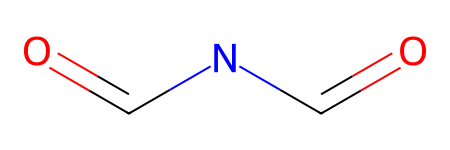

546 molecules with imide substructure found.
473 molecules remaining after filtering undesired substructures.


In [6]:
def get_fresh_mols(sample_file, training_file):
    # Load training data
    training_smiles = set()
    with open(training_file, "r") as f:
        for line in f:
            if line.strip():
                mol = Chem.MolFromSmiles(line.split()[0])
                if mol: training_smiles.add(Chem.MolToSmiles(mol))
    
    # Filter sampled molecules
    fresh_mols = []
    with open(sample_file, "r") as f:
        for line in f:
            if line.strip():
                mol = Chem.MolFromSmiles(line.split()[0])
                if mol and Chem.MolToSmiles(mol) not in training_smiles:
                    fresh_mols.append(mol)
                    
    return fresh_mols

def substructure_filter(mol_list, substructure_smarts):

    substructure = Chem.MolFromSmarts(substructure_smarts)
    filtered_mols = [mol for mol in mol_list if mol.HasSubstructMatch(substructure)]

    return filtered_mols

fresh_mols = get_fresh_mols("sampleprior/Prior_1000.smi", "../all_crbn_unique_KNIME_processed_dataset.smi")
print(f"{len(fresh_mols)} fresh molecules found.")

imide_smarts_new = 'C(=O)-[NH]-C(=O)'
imide = Chem.MolFromSmarts(imide_smarts_new)
display(imide)
filtered_mols = substructure_filter(fresh_mols, imide_smarts_new)
print(f"{len(filtered_mols)} molecules with imide substructure found.")

df_badsubstructures = pd.read_csv("../../unwanted_substructures.csv")
df_badsubstructures = df_badsubstructures.loc[~df_badsubstructures['name'].isin(['phosphor-P-phthalimide'])]
bad_dict = {}
for n, s in df_badsubstructures[['name', 'smarts']].itertuples(index=False):
    bad_dict[n] = Chem.MolFromSmarts(s)
undesired = []
clean = []
for m in filtered_mols:
    match = False
    for substrate_name, substructure in bad_dict.items():
        if m.HasSubstructMatch(substructure):
            #display(Draw.MolToImage(m, size=(300,300), legend=f'Matched undesired substructure: {substrate_name}'))
            undesired.append(m)
            match = True
            break
    if not match:
        clean.append(m)
print(f"{len(clean)} molecules remaining after filtering undesired substructures.")

#sort clean molecules by descending QED score
clean.sort(key=lambda x: QED.qed(x), reverse=True)

# Generate dataframe with QED scores and SMILES for robust mols2grid display
results = []
for m in clean:
    results.append({"SMILES": Chem.MolToSmiles(m), "QED": QED.qed(m)})
df_clean = pd.DataFrame(results)

mols2grid.display(df_clean, subset=["img", "SMILES", "QED"], smiles_col="SMILES", transform={"QED": lambda x: f"{x:.2f}"}, prerender=True, name=f"grid_{int(time.time())}")

In [8]:
df_clean[['SMILES', 'QED']].head(100).to_csv("cleaned_fresh_imide_molecules_top100_QED_approach1.csv", index=False)

In [9]:
#change the strategy to fine tune from a large prior model
!python /home/haolan/SMILES-RNN/scripts/fine_tune.py \
-p /home/haolan/REINVENT4/Priors/reinvent.prior \
-i ../all_crbn_unique_KNIME_processed_dataset.smi \
-o finetuneprior \
-s finetuneprior \
--model RNN \
--randomize

Device set to cuda
Loading smiles
Randomizing 4018 training smiles
100%|██████████████████████████████████████| 4018/4018 [00:06<00:00, 645.25it/s]
Returned 39361 randomized training smiles
Beginning training
Epoch 1
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 23.93it/s]
Epoch 2
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 24.52it/s]
Epoch 3
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 24.32it/s]
Epoch 4
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 24.49it/s]
Epoch 5
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 24.18it/s]
Epoch 6
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 24.32it/s]
Epoch 7
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 24.35it/s]
Epoch 8
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 24.33it/s]
Epoch 9
100%|█████████████████████████████████████████| 308/308 [00:12<00:00, 2

In [10]:
%reload_ext tensorboard
log_dir = os.path.abspath("finetuneprior/tb_finetuneprior")
%tensorboard --logdir "{log_dir}" --host localhost

Reusing TensorBoard on port 6006 (pid 108709), started 3 days, 13:45:22 ago. (Use '!kill 108709' to kill it.)

In [11]:
!python /home/haolan/SMILES-RNN/scripts/sample_model.py -p finetuneprior/Prior_finetuneprior_Epoch-10.ckpt \
-m RNN \
-o samplefinetuneprior/Prior_1000.smi \
-n 1000

Device set to cuda
Saving 1000 smiles


513 fresh molecules found.


[11:10:49] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 14 15
[11:10:49] Can't kekulize mol.  Unkekulized atoms: 0 2 3 4 22
[11:10:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 15 28
[11:10:49] Can't kekulize mol.  Unkekulized atoms: 0 1 17
[11:10:49] Can't kekulize mol.  Unkekulized atoms: 0 3 5 7 10 11
[11:10:49] Can't kekulize mol.  Unkekulized atoms: 0 3 21 22 23
[11:10:49] SMILES Parse Error: unclosed ring for input: 'c1c(F)c(NC23CCC(=O)NC2=O)ccc(F)c1'
[11:10:49] Can't kekulize mol.  Unkekulized atoms: 0 1 21 22 26
[11:10:49] SMILES Parse Error: ring closure 3 duplicates bond between atom 6 and atom 10 for input: 'c12c(cc(NC(C3(C4CC4)C3)=O)cc1)C(=O)N(C1C(=O)NC(=O)CC1)C2'


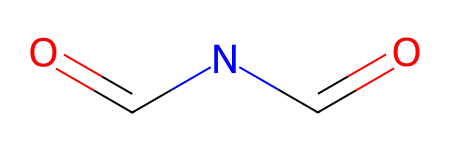

470 molecules with imide substructure found.
426 molecules remaining after filtering undesired substructures.


In [12]:
fresh_mols = get_fresh_mols("samplefinetuneprior/Prior_1000.smi", "../all_crbn_unique_KNIME_processed_dataset.smi")
print(f"{len(fresh_mols)} fresh molecules found.")

imide_smarts_new = 'C(=O)-[NH]-C(=O)'
imide = Chem.MolFromSmarts(imide_smarts_new)
display(imide)
filtered_mols = substructure_filter(fresh_mols, imide_smarts_new)
print(f"{len(filtered_mols)} molecules with imide substructure found.")

df_badsubstructures = pd.read_csv("../../unwanted_substructures.csv")
df_badsubstructures = df_badsubstructures.loc[~df_badsubstructures['name'].isin(['phosphor-P-phthalimide'])]
bad_dict = {}
for n, s in df_badsubstructures[['name', 'smarts']].itertuples(index=False):
    bad_dict[n] = Chem.MolFromSmarts(s)
undesired = []
clean = []
for m in filtered_mols:
    match = False
    for substrate_name, substructure in bad_dict.items():
        if m.HasSubstructMatch(substructure):
            #display(Draw.MolToImage(m, size=(300,300), legend=f'Matched undesired substructure: {substrate_name}'))
            undesired.append(m)
            match = True
            break
    if not match:
        clean.append(m)
print(f"{len(clean)} molecules remaining after filtering undesired substructures.")

#sort clean molecules by descending QED score
clean.sort(key=lambda x: QED.qed(x), reverse=True)

# Generate dataframe with QED scores and SMILES for robust mols2grid display
results = []
for m in clean:
    results.append({"SMILES": Chem.MolToSmiles(m), "QED": QED.qed(m)})
df_clean = pd.DataFrame(results)

mols2grid.display(df_clean, subset=["img", "SMILES", "QED"], smiles_col="SMILES", transform={"QED": lambda x: f"{x:.2f}"}, prerender=True, name=f"grid_{int(time.time())}")

In [13]:
df_clean[['SMILES', 'QED']].head(100).to_csv("cleaned_fresh_imide_molecules_top100_QED_approach2.csv", index=False)